<a href="https://colab.research.google.com/github/damithkawshan/Radar-and-Navigation/blob/main/Radar_and_Navigation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import files
uploaded = files.upload()

Saving raw_data1.csv to raw_data1.csv
Saving raw_data2.csv to raw_data2.csv
Saving raw_data3.csv to raw_data3.csv


In [206]:
import pandas as pd
import io
import matplotlib.pyplot as plt
import seaborn as sns



#read first test case
df = pd.read_csv(io.StringIO(uploaded['raw_data3.csv'].decode('utf-8')),sep=';',header=None,squeeze=True)
Raw_data = df.to_numpy()

Plot Original Data from Radar Decoder

In [196]:
df.plot.line(figsize = (500,50))

In [207]:
#parameters

N = 30 # no of bins
fr = 1800 # pulse repitition freq
Fs_orig = 1080*1000 #original sampling freq 1080kHz

#thresholding
sigma_n = 1
k = 1

In [208]:
Fs = N*fr #sampling freq
Ts = Fs_orig / Fs #sampling period for the data frame
len_Radar = df.size #size of the data frame

sample_matrix=Raw_data.reshape(int(len_Radar/Ts),int(Ts)) #reshape into 900x20 matrix (simplify the calculations)

In [209]:
Radar_sampled = sample_matrix[:,0] #get the sampled data  (first sample is ignored)

Plot sampled Data

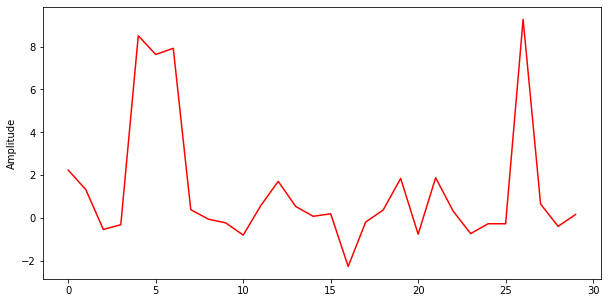

In [210]:
plt.figure(figsize=(10, 5))
plt.plot(Radar_sampled[0:30],c='r')
plt.ylabel('Amplitude')
plt.show()

In [211]:
#get the average noise
#get noise window #get prev 10 values next 10 values (ignore 4 nearest values from either sides)

next_samples = sample_matrix[:,5:11]
A = sample_matrix[:899,10:16]
prev_samples = np.vstack([A[0],A])

#noise average vector
Avg_noise = np.mean(np.concatenate((next_samples,prev_samples),axis=1),axis=1)

#threshold vector
V_threshold = Avg_noise + k*sigma_n

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  


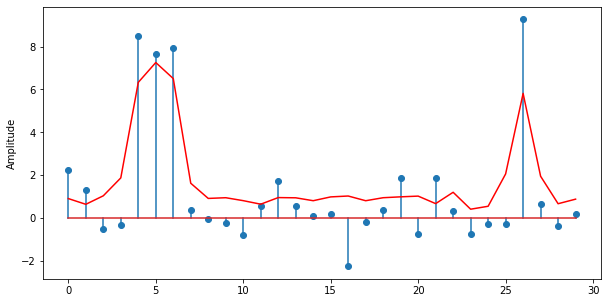

In [213]:
plt.figure(figsize=(10, 5))
plt.stem(Radar_sampled[0:30])
plt.plot(V_threshold[0:30],color='r')
plt.ylabel('Amplitude')
plt.show()

In [216]:
#perform threshold detection
Radar_filt = (Radar_sampled > V_threshold)*1

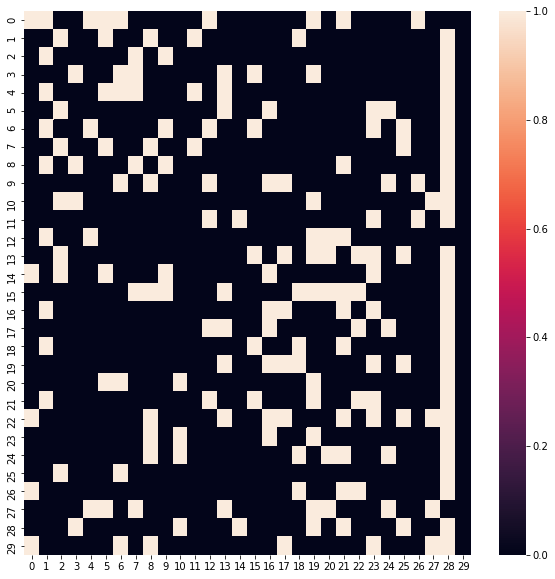

In [215]:
plt.figure(figsize=(10, 10))
ax = sns.heatmap(Radar_filt.reshape(30,30))